In [107]:
import pandas as pd
import numpy as np
import seaborn as sns

In [167]:
# Opening all four text files containg youtube comments of four different youtube channels
with open('Fox_Comments.txt') as a, open('CNN_Comments.txt') as b, open('BBC_Comments.txt') as c, open('Breitbart_Comments.txt') as d:
    Fox_News = a.read()
    CNN_News = b.read()
    BBC_News = c.read()
    Breitbart_News = d.read()
    
Channel_Names = ['Fox News', 'CNN', 'BBC News', 'Breitbart News'] # News Channel Names

Channel_Comments = [Fox_News, CNN_News, BBC_News, Breitbart_News] # News Channel strings (text corpus)
    
data_dict = {'Channel': Channel_Names, 'Channel_Comments': Channel_Comments} # storing these lists into a dict

df = pd.DataFrame(data_dict) # making dict into a pd.dataframe
df = df.set_index('Channel')

df

,Channel,Channel_Comments
0,Fox News,Notice two common denominator in Detroit and B...
1,CNN,"Hey, Chris here whats the number one thing yo..."
2,BBC News,Please subtitle e English\nYe bhosdi waale k...
3,Breitbart News,Tay A.I. Said it beast Ted Cruz would not be s...


In [168]:
df['Channel_Comments']

Channel
Fox News          Notice two common denominator in Detroit and B...
CNN               Hey, Chris here  whats the number one thing yo...
BBC News          Please  subtitle  e English\nYe bhosdi waale k...
Breitbart News    Tay A.I. Said it beast Ted Cruz would not be s...
Name: Channel_Comments, dtype: object

 ### Testing to see that full concatanted comment file is here

## Text Cleaning

In [56]:
import re
import string

def clean_text(text): # defining function that takes string and removes all unwanted symbols with regex
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', ' ', text)
    text = re.sub('\bbr\b', '', text)
    return text

clean = lambda x: clean_text(x)

In [57]:
df_clean = pd.DataFrame(df.Channel_Comments.apply(clean))
df_clean.Channel_Comments.loc['Fox News'] #Updated text, includes all regular expressions

'notice two common denominator in detroit and baltimore if not look at africa i feel bad for those people in detroit growing up there and having to see what   s happened to this beautiful city democrats are now in crisis mode       b  get er don libs     b  br   where are the ymca and the ywca for youth and adult activities  games  crafts  swimming  exercise  etc    the dems have destroyed the state of michigan     time for a huge change       should of asked them how did they like the property tax increase from the democratic governor they just elected  my property taxes were raised by a third a third  coincidentally the governor has invented new social programs most centered around people who in reality made bad life choices  nice work  correspondents   that couldn   t be easy  the civil rights act plus bloat in the various welfare services  and feminism has been the most destructive on the black family and community  but also has filtered through other identity communities  br    br

In [58]:
# We are going to create a document-term matrix using CountVectorizer, and exclude common English stop words
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
df_cv = cv.fit_transform(df_clean.Channel_Comments) #removing common english stop words
df_dtm = pd.DataFrame(df_cv.toarray(), columns=cv.get_feature_names())
df_dtm.index = df_clean.index
df_dtm

,aa,aaa,aaaaaaahahahahahaha,aaaaaaannnnnnndddddd,aaaaannnnndddddd,aaaall,aaaannnnnnd,aaah,aaam,aaauuuggghhh,...,zuckerberg,zum,zv,zxs,zzz,zzzzz,zzzzzz,zzzzzzzquiltrump,zzzzzzzz,zzzzzzzzz
Channel,,,,,,,,,,,,,,,,,,,,,
Fox News,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CNN,4,0,0,1,1,1,1,0,0,3,...,1,1,2,0,1,1,2,1,1,0
BBC_News,0,1,0,0,0,0,0,1,3,0,...,0,0,0,2,0,0,2,0,0,1
Breitbart_News,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [176]:
df_dtm = df_dtm.transpose() # transposing so it is more readable, less columns, more rows
df_dtm

Channel,Fox News,CNN,BBC_News,Breitbart_News
aa,0,4,0,0
aaa,0,0,1,0
aaaaaaahahahahahaha,1,0,0,0
aaaaaaannnnnnndddddd,0,1,0,0
aaaaannnnndddddd,0,1,0,0
aaaall,0,1,0,0
aaaannnnnnd,0,1,0,0
aaah,0,0,1,0
aaam,0,0,3,0
aaauuuggghhh,0,3,0,0


In [177]:
# Find the top 30 words in each corpus (youtube channel)
top30_dict = {}
for i in df_dtm.columns:
    top = df_dtm[i].sort_values(ascending=False).head(30)
    top30_dict[i]= list(zip(top.index, top.values))

top30_dict

{'Fox News': [('br', 1720),
  ('trump', 1519),
  ('quot', 1227),
  ('people', 1113),
  ('omar', 891),
  ('like', 787),
  ('just', 689),
  ('democrats', 537),
  ('america', 532),
  ('president', 525),
  ('country', 477),
  ('racist', 440),
  ('don', 397),
  ('american', 369),
  ('white', 359),
  ('fox', 355),
  ('baltimore', 345),
  ('know', 337),
  ('news', 335),
  ('juan', 330),
  ('time', 311),
  ('right', 299),
  ('left', 295),
  ('need', 290),
  ('diversity', 284),
  ('want', 281),
  ('going', 276),
  ('did', 274),
  ('say', 274),
  ('think', 266)],
 'CNN': [('br', 8712),
  ('trump', 7938),
  ('cnn', 5050),
  ('people', 4214),
  ('quot', 4072),
  ('like', 2811),
  ('news', 2785),
  ('racist', 2573),
  ('just', 2429),
  ('fake', 2336),
  ('president', 1964),
  ('baltimore', 1827),
  ('don', 1755),
  ('white', 1598),
  ('black', 1537),
  ('america', 1510),
  ('href', 1334),
  ('com', 1303),
  ('democrats', 1268),
  ('vote', 1243),
  ('bernie', 1220),
  ('know', 1216),
  ('www', 1180)

In [61]:
# organizing hte top 15 comments in each channel, as we see there are words that need to be removed, such as 'br'

for Channel, top_words in top30_dict.items():
    print(Channel)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')

Fox News
br, trump, quot, people, omar, like, just, democrats, america, president, country, racist, don, american
---
CNN
br, trump, cnn, people, quot, like, news, racist, just, fake, president, baltimore, don, white
---
BBC_News
br, bbc, people, deal, like, eu, quot, just, uk, boris, brexit, hong, china, news
---
Breitbart_News
br, quot, trump, people, like, just, president, democrats, omar, https, amp, country, party, america
---


In [62]:
# Look at the most common top words 
from collections import Counter

# Let's first pull out the top 30 words for each channel
words = []
for Channel in df_dtm.columns:
    top = [word for (word, count) in top30_dict[Channel]]
    for t in top:
        words.append(t)
        
words

['br',
 'trump',
 'quot',
 'people',
 'omar',
 'like',
 'just',
 'democrats',
 'america',
 'president',
 'country',
 'racist',
 'don',
 'american',
 'white',
 'fox',
 'baltimore',
 'know',
 'news',
 'juan',
 'time',
 'right',
 'left',
 'need',
 'diversity',
 'want',
 'going',
 'did',
 'say',
 'think',
 'br',
 'trump',
 'cnn',
 'people',
 'quot',
 'like',
 'news',
 'racist',
 'just',
 'fake',
 'president',
 'baltimore',
 'don',
 'white',
 'black',
 'america',
 'href',
 'com',
 'democrats',
 'vote',
 'bernie',
 'know',
 'www',
 'country',
 'youtube',
 'https',
 'going',
 'right',
 'man',
 'time',
 'br',
 'bbc',
 'people',
 'deal',
 'like',
 'eu',
 'quot',
 'just',
 'uk',
 'boris',
 'brexit',
 'hong',
 'china',
 'news',
 'kong',
 'want',
 'good',
 'world',
 'don',
 'trump',
 'href',
 'country',
 'https',
 'leave',
 'time',
 'com',
 'make',
 'going',
 'british',
 'youtube',
 'br',
 'quot',
 'trump',
 'people',
 'like',
 'just',
 'president',
 'democrats',
 'omar',
 'https',
 'amp',
 'count

In [63]:
Counter(words).most_common()

[('br', 4),
 ('trump', 4),
 ('quot', 4),
 ('people', 4),
 ('like', 4),
 ('just', 4),
 ('country', 4),
 ('don', 4),
 ('time', 4),
 ('democrats', 3),
 ('america', 3),
 ('president', 3),
 ('know', 3),
 ('news', 3),
 ('going', 3),
 ('href', 3),
 ('com', 3),
 ('https', 3),
 ('omar', 2),
 ('racist', 2),
 ('american', 2),
 ('white', 2),
 ('baltimore', 2),
 ('right', 2),
 ('need', 2),
 ('want', 2),
 ('think', 2),
 ('youtube', 2),
 ('good', 2),
 ('fox', 1),
 ('juan', 1),
 ('left', 1),
 ('diversity', 1),
 ('did', 1),
 ('say', 1),
 ('cnn', 1),
 ('fake', 1),
 ('black', 1),
 ('vote', 1),
 ('bernie', 1),
 ('www', 1),
 ('man', 1),
 ('bbc', 1),
 ('deal', 1),
 ('eu', 1),
 ('uk', 1),
 ('boris', 1),
 ('brexit', 1),
 ('hong', 1),
 ('china', 1),
 ('kong', 1),
 ('world', 1),
 ('leave', 1),
 ('make', 1),
 ('british', 1),
 ('amp', 1),
 ('party', 1),
 ('candace', 1),
 ('harris', 1),
 ('kamala', 1),
 ('mueller', 1),
 ('love', 1),
 ('squad', 1),
 ('democrat', 1)]

In [88]:
add_stop_words = ['br', 'just', 'quot', 'com', 'href', 'com', 'https', 'like']
# getting rid of words that are filler or meaningless

In [89]:
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer

df_clean

stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words) # adding new stop words to original list

cv = CountVectorizer(stop_words=stop_words) 
df_cv2 = cv.fit_transform(df_clean.Channel_Comments) 
df_dtm2 = pd.DataFrame(df_cv2.toarray(), columns=cv.get_feature_names()) # creating the dtm again with new stop words
df_dtm2.index = df_clean.index
df_dtm2_t = df_dtm2.transpose() # New dtm that we are using, got rid of all unwanted words
df_dtm2_t

Channel,Fox News,CNN,BBC_News,Breitbart_News
aa,0,4,0,0
aaa,0,0,1,0
aaaaaaahahahahahaha,1,0,0,0
aaaaaaannnnnnndddddd,0,1,0,0
aaaaannnnndddddd,0,1,0,0
aaaall,0,1,0,0
aaaannnnnnd,0,1,0,0
aaah,0,0,1,0
aaam,0,0,3,0
aaauuuggghhh,0,3,0,0


In [90]:
# Find the top 30 words in each corpus (youtube channel)
top30_dict = {}
for i in df_dtm2_t.columns:
    top = df_dtm2_t[i].sort_values(ascending=False).head(30)
    top30_dict[i]= list(zip(top.index, top.values))

top30_dict

{'Fox News': [('trump', 1519),
  ('people', 1113),
  ('omar', 891),
  ('democrats', 537),
  ('america', 532),
  ('president', 525),
  ('country', 477),
  ('racist', 440),
  ('don', 397),
  ('american', 369),
  ('white', 359),
  ('fox', 355),
  ('baltimore', 345),
  ('know', 337),
  ('news', 335),
  ('juan', 330),
  ('time', 311),
  ('right', 299),
  ('left', 295),
  ('need', 290),
  ('diversity', 284),
  ('want', 281),
  ('going', 276),
  ('say', 274),
  ('did', 274),
  ('think', 266),
  ('somalia', 259),
  ('make', 248),
  ('ilhan', 244),
  ('way', 243)],
 'CNN': [('trump', 7938),
  ('cnn', 5050),
  ('people', 4214),
  ('news', 2785),
  ('racist', 2573),
  ('fake', 2336),
  ('president', 1964),
  ('baltimore', 1827),
  ('don', 1755),
  ('white', 1598),
  ('black', 1537),
  ('america', 1510),
  ('democrats', 1268),
  ('vote', 1243),
  ('bernie', 1220),
  ('know', 1216),
  ('www', 1180),
  ('country', 1156),
  ('youtube', 1106),
  ('going', 1067),
  ('right', 1057),
  ('man', 1051),
  (

In [91]:
for Channel, top_words in top30_dict.items(): # redoing the top 15, without useless words
    print(Channel)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')

Fox News
trump, people, omar, democrats, america, president, country, racist, don, american, white, fox, baltimore, know
---
CNN
trump, cnn, people, news, racist, fake, president, baltimore, don, white, black, america, democrats, vote
---
BBC_News
bbc, people, deal, eu, uk, boris, brexit, hong, china, news, kong, want, good, world
---
Breitbart_News
trump, people, president, democrats, omar, amp, country, party, america, harris, candace, kamala, know, time
---


### Done with preprocessing

## Start of EDA: Word Cloud

In [92]:
from wordcloud import WordCloud

wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)
df_clean

,Channel_Comments
Channel,
Fox News,notice two common denominator in detroit and b...
CNN,hey chris here whats the number one thing yo...
BBC_News,please subtitle e english ye bhosdi waale kh...
Breitbart_News,tay a i said it beast ted cruz would not be s...


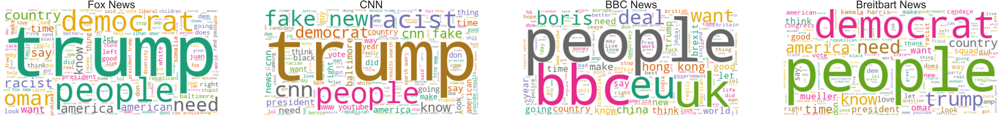

In [174]:
import matplotlib.pyplot as plt


plt.rcParams['figure.figsize'] = [200, 200] # wordcloud showing counts visually



Channel_Names = ['Fox News', 'CNN', 'BBC News', 'Breitbart News']

# Create subplots for each News Channel
for index, Channel in enumerate(df_dtm2_t.columns):
    wc.generate(df_clean.Channel_Comments[Channel])
    
    plt.subplot(3, 4, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(Channel_Names[index], fontsize=120)
    
plt.show()

## Number of Unique Words Found in Each Channel

In [106]:

# Identify the non-zero items in the document-term matrix, meaning that the word occurs at least once
unique_list = []
for channel in df_dtm2_t.columns:
    uniques = df_dtm2_t[channel].to_numpy().nonzero()[0].size
    unique_list.append(uniques)
    
sum_list = [df_dtm2_t['Fox News'].sum(), df_dtm2_t['CNN'].sum(), df_dtm2_t['BBC_News'].sum(), df_dtm2_t['Breitbart_News'].sum()]
perc_unique = [int(a) / int(b) for a,b in zip(unique_list, sum_list)]


# Create a new dataframe that contains this unique word count
data_words = pd.DataFrame(list(zip(Channel_Names, unique_list, sum_list, perc_unique)), columns=['Channel', 'Unique Words', 'Total Words', '% Unique Words'])
data_unique_sort = data_words.sort_values(by='% Unique Words')
data_unique_sort


,Channel,Unique Words,Total Words,% Unique Words
1,CNN,23039,328966,0.070035
0,Fox News,12206,89248,0.136765
2,BBC News,11072,64150,0.172595
3,Breitbart News,4449,13741,0.323776


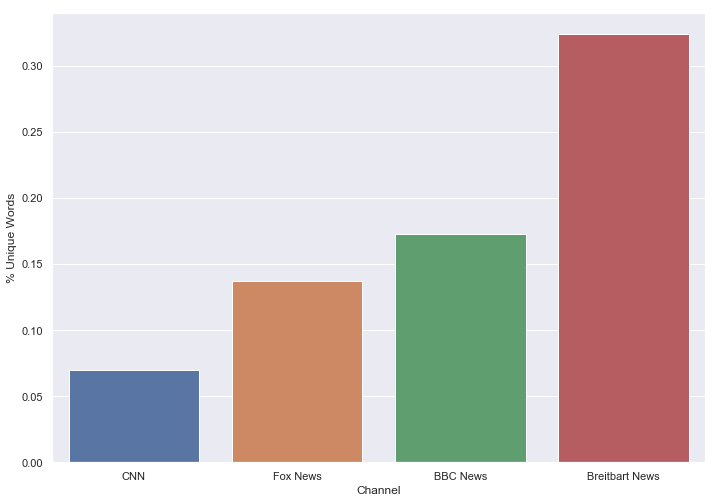

In [110]:
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(11.7,8.27)})

ax = sns.barplot(x="Channel", y="% Unique Words", data=data_unique_sort)

# Bias because Breitbart had the smallest sample size, inflation due to undersampling in Breitbart

## Measuring Profanity/Vulgarity

In [112]:
data_bad_words = df_dtm2[['fucking', 'fuck', 'shit']]
data_profanity = pd.concat([data_bad_words.fucking + data_bad_words.fuck, data_bad_words.shit], axis=1)
data_profanity.columns = ['f_word', 's_word']
data_profanity


#Scrapped section, our data cleaning was not sufficient to encompass variety of curse words and variation of spelling

,f_word,s_word
Channel,,
Fox News,1,2
CNN,960,788
BBC_News,169,130
Breitbart_News,23,26


## Sentiment Analysis

In [135]:
# We use the original df created, including punctuation and stop words. We are looking at full structures, not just a 
# bag of words.

df = df.reset_index()
df

,Channel,Channel_Comments
0,Fox News,Notice two common denominator in Detroit and B...
1,CNN,"Hey, Chris here whats the number one thing yo..."
2,BBC News,Please subtitle e English\nYe bhosdi waale k...
3,Breitbart News,Tay A.I. Said it beast Ted Cruz would not be s...


In [137]:
# TextBlob's algorithm takes into account word frequency, as well as order of words in a sentence. This is the 
# reason we have to include punctuation in our channel corpuses

from textblob import TextBlob

pol = lambda x: TextBlob(x).sentiment.polarity
subj = lambda x: TextBlob(x).sentiment.subjectivity

df['polarity'] = df['Channel_Comments'].apply(pol) # adding polarity column
df['subjectivity'] = df['Channel_Comments'].apply(subj) # adding subjectivity column
df

,Channel,Channel_Comments,polarity,subjectivity
0,Fox News,Notice two common denominator in Detroit and B...,0.031861,0.504749
1,CNN,"Hey, Chris here whats the number one thing yo...",0.007912,0.525758
2,BBC News,Please subtitle e English\nYe bhosdi waale k...,0.046726,0.493486
3,Breitbart News,Tay A.I. Said it beast Ted Cruz would not be s...,0.032981,0.507723


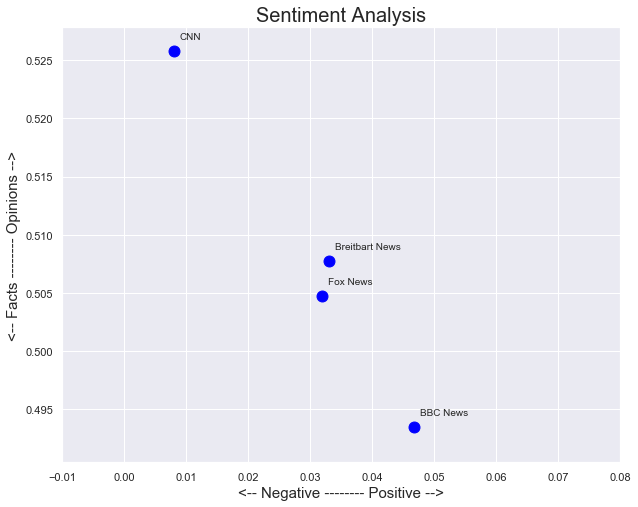

In [166]:

plt.rcParams['figure.figsize'] = [10, 8]

for index, channel in enumerate(df.index):
    x = df.polarity.loc[channel]
    y = df.subjectivity.loc[channel]
    plt.scatter(x, y, color='blue', s = 120)
    plt.text(x+.001, y+.001, df['Channel'][index], fontsize=10)
    plt.xlim(-.01, .08) 
    
plt.title('Sentiment Analysis', fontsize=20)
plt.xlabel('<-- Negative -------- Positive -->', fontsize=15)
plt.ylabel('<-- Facts -------- Opinions -->', fontsize=15)

plt.show() # Results are displayed on a two axes, the y being subjectivity, the x being sentiment polarity

## Sentiment Analysis of Comments Over Time

In [155]:
import math

def split_text(text, n=20):
    # Takes in a string and cuts it into 10 equal parts
    length = len(text) # Calculating length of string
    size = math.floor(length / n) # Calculating size of chunk
    start = np.arange(0, length, size) # Calculating where the starting points of each chunk of text are
    
    # Putting equally sized chunks into a list
    split_list = []
    for piece in range(n):
        split_list.append(text[start[piece]:start[piece]+size])
    return split_list

In [156]:
list_chunks = []
for t in df.Channel_Comments:
    split = split_text(t)
    list_chunks.append(split)
    
list_chunks

[['Notice two common denominator in Detroit and Baltimore if not look at africa\nI feel bad for those people in Detroit growing up there and having to see what&#39;s happened to this beautiful city\nDemocrats are now in CRISIS MODE....  <b>*Get Er Don Libs !*</b><br />Where are the YMCA and the YWCA for youth and adult activities, games, crafts, swimming, exercise, etc. ?\nThe dems have destroyed the state of michigan.... Time for a huge change......\nShould of asked them how did they like the property tax increase from the democratic Governor they just elected! My property taxes were raised by a third a third! Coincidentally the governor has invented new social programs most centered around people who in reality made bad life choices.\nNice work, correspondents.  That couldn&#39;t be easy.\nThe civil rights act plus bloat in the various welfare services  and feminism has been the most destructive on the black family and community, but also has filtered through other identity communiti

In [157]:
len(list_chunks) # = 4 ~ 4 channels
len(list_chunks[0]) # = 10 ~ 10 chunks for each channel

20

In [158]:
#Calculating Polarity for each chunk of each channel

polarity_channel_comments = []
for lc in list_chunks:
    polarity_chunk = []
    for c in lc:
        polarity_chunk.append(TextBlob(c).sentiment.polarity)
    polarity_channel_comments.append(polarity_chunk)
    
polarity_channel_comments

[[0.047932108576448876,
  0.0545388751894382,
  0.09204254977159815,
  0.06709198395401984,
  0.016196377531340674,
  0.0372353234644541,
  0.006578823172568107,
  0.030935239482252488,
  -0.0031761212495499728,
  0.01336781239117843,
  0.04520765866569846,
  0.05244689315973705,
  0.01603315616725385,
  0.03571609306009103,
  0.040112471333449286,
  0.04460194677485449,
  0.06377989661251017,
  -0.014302153845790406,
  -0.018506293483765205,
  0.0036422592280067143],
 [0.0726545744837285,
  0.04724428157761393,
  0.028689153143902538,
  -0.021214240392013545,
  0.005683514458794534,
  0.02293028619318717,
  -0.010807534326675609,
  0.03150302251347842,
  0.04037092253608215,
  -0.054000380437335765,
  -0.017721565801209864,
  -0.01367655883585012,
  0.0066399781504911815,
  0.014470263094779515,
  -0.013813631260514974,
  -0.0008402678039100984,
  0.02647124338768953,
  0.0337371114686081,
  -0.009790541758279824,
  -0.023095686678929216],
 [0.06782377820017267,
  0.09707620028409086,

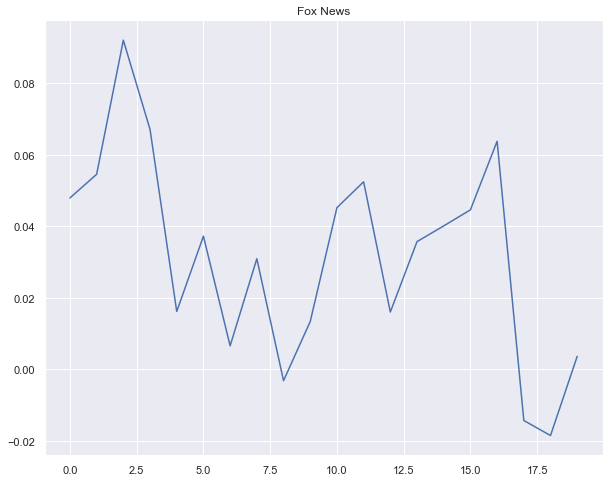

In [159]:
#Visualizing one of the news channel's comment section polarity, from latest video to 20th video back

#Starting with Fox

plt.plot(polarity_channel_comments[0]) # For Fox News, which is the first in the list of news channels
plt.title(df['Channel'][0])
plt.show()

###
### These figures were not included in report: comments were not put in order, so analysis less meaningful

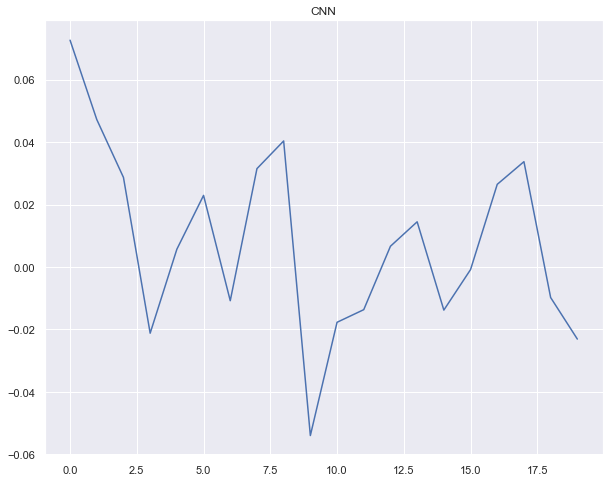

In [160]:
#Looking at CNN

plt.plot(polarity_channel_comments[1]) 
plt.title(df['Channel'][1])
plt.show()

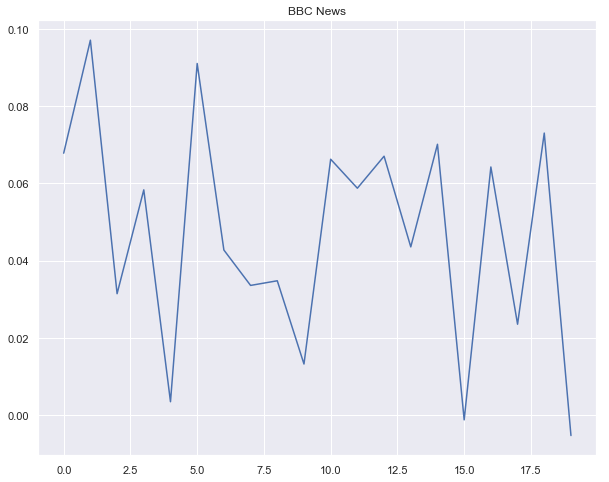

In [161]:
#Looking at BBC

plt.plot(polarity_channel_comments[2]) 
plt.title(df['Channel'][2])
plt.show()

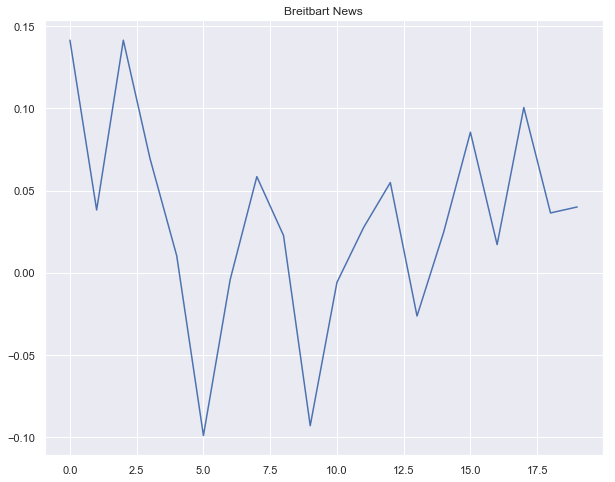

In [162]:
#Looking at Breitbart

plt.plot(polarity_channel_comments[3]) 
plt.title(df['Channel'][3])
plt.show()